In [7]:
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [8]:
# Defined path of CSV file.
DIRECTORY = Path('')

# Read CSV file from the defined path & ignoring lines start with # that are metadata.
df = pd.read_csv(DIRECTORY/'EEG_and_ECG data_02_raw.csv', comment = '#')

In [9]:
# Column names of dataset.
print(df.columns.tolist())

['Time', 'P3', 'C3', 'F3', 'Fz', 'F4', 'C4', 'P4', 'Cz', 'CM', 'A1', 'Fp1', 'Fp2', 'T3', 'T5', 'O1', 'O2', 'X3:', 'X2:REOG', 'F7', 'F8', 'X1:LEOG', 'A2', 'T6', 'T4', 'Pz', 'Trigger', 'Time_Offset', 'ADC_Status', 'ADC_Sequence', 'Event', 'Comments']


In [10]:
# Verfication of required data.
df.head()

,Time,P3,C3,F3,Fz,F4,C4,P4,Cz,CM,...,A2,T6,T4,Pz,Trigger,Time_Offset,ADC_Status,ADC_Sequence,Event,Comments
0,0.0000,2.1,-53.9,52.1,12.6,26.4,-40.7,-37.1,-13.1,-892.5,...,-37.8,-50.4,-66.1,0,0,6,0,8,0,NaN
1,0.0033,23.7,15.9,96.7,75.0,68.0,14.7,14.7,87.5,-1264.4,...,4.5,-8.7,-38.0,0,0,12,0,9,0,NaN
2,0.0067,-50.7,-68.3,33.2,-8.7,4.8,-58.1,-58.9,-16.1,-1041.3,...,-69.8,-69.9,-88.5,0,0,18,0,10,0,NaN
3,0.0100,28.2,5.1,92.5,57.9,67.7,1.2,7.5,45.1,-1190.0,...,0.3,-9.3,-35.0,0,0,24,0,11,0,NaN
4,0.0133,-33.6,-26.9,60.4,34.8,27.6,-25.8,-20.9,57.9,-1338.8,...,-44.1,-40.2,-75.0,0,0,30,0,12,0,NaN


In [11]:
time = "Time"

# Available channels in EEG (mV unit).
eeg_channels = ['P3', 'C3', 'F3', 'Fz', 'F4', 'C4', 'P4', 'Cz', 'A1', 'Fp1', 'Fp2', 'T3', 'T5', 'O1', 'O2', 'F7', 'F8', 'A2', 'T6', 'T4', 'Pz']

# Available channels in ECG (μV unit).
ecg_channels = ['X1:LEOG', 'X2:REOG']

# Available channels in Common Mode (CM) (mV unit).
other_channels = ['CM']

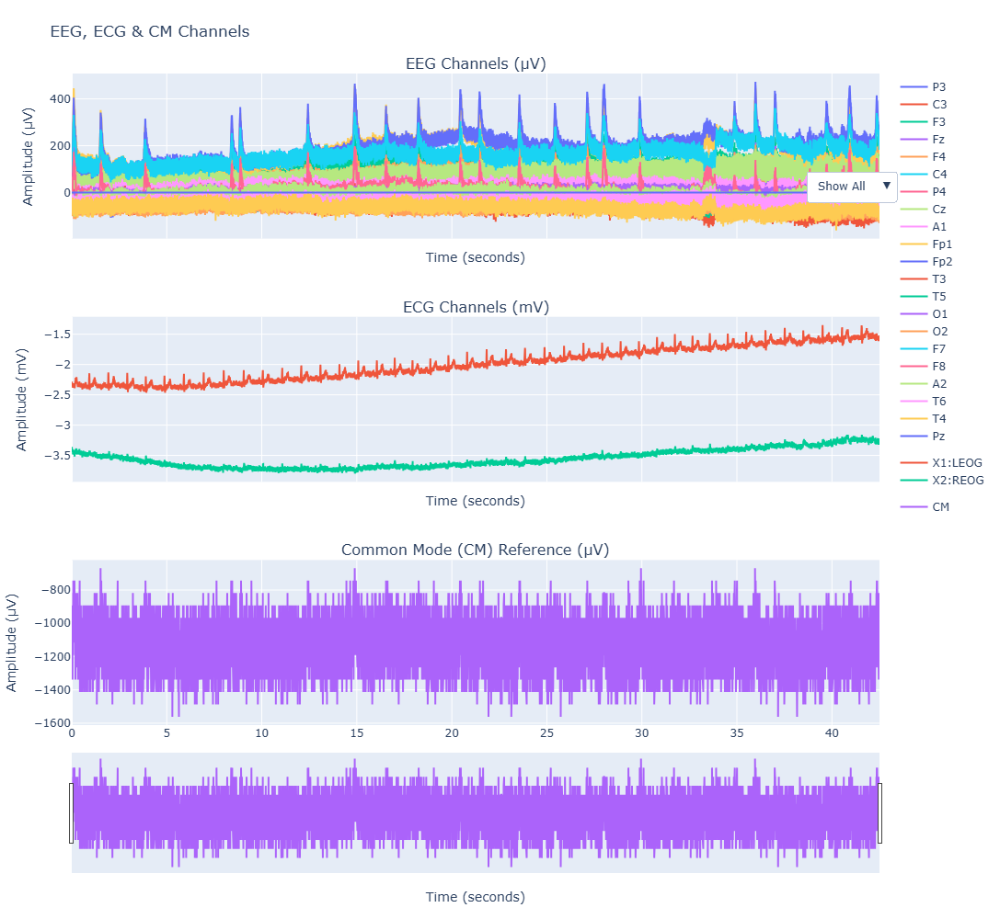

Plot displayed successfully!
Success: Plot contains 24 traces


In [12]:
# Convert ECG from μV to mV
for ch in ecg_channels:
    if ch in df.columns:
        df[ch] = df[ch] / 1000.0

# Create subplots with different y-axes and shared x-axis for different signal types.
fig = make_subplots(rows=3,
                    cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.12,
                    subplot_titles=("EEG Channels (μV)", "ECG Channels (mV)", "Common Mode (CM) Reference (μV)",))

# EEG tracker
for ch in eeg_channels:
    if ch in df.columns:
        fig.add_trace(
        go.Scatter(
            x=df[time],
            y=df[ch],
            mode='lines',
            name=ch,
            legendgroup='eeg',
            showlegend=True
        ),
        row=1,
        col=1
    )

# ECG tracker
for ch in ecg_channels:
    if ch in df.columns:
        fig.add_trace(
        go.Scatter(
            x=df[time],
            y=df[ch],
            mode='lines',
            name=ch,
            legendgroup='ecg',
            showlegend=True
        ),
        row=2,
        col=1
    )

# CM tracker
fig.add_trace(
        go.Scatter(
            x=df[time],
            y=df['CM'],
            mode='lines',
            name='CM',
            legendgroup='cm',
            showlegend=True
        ),
        row=3,
        col=1
    )

def group_visibility(target_group):
    # Get the channels relevant group.
    return [(getattr(trace, "legendgroup", None) == target_group) for trace in fig.data]
# Dropdown buttons to view group plotting.
buttons = [
    dict(label="Show All",
         method="update",
         args=[{"visible": [True] * len(fig.data)}]),
    dict(label="EEG Only",
         method="update",
         args=[{"visible": group_visibility("eeg")}]),
    dict(label="ECG Only",
         method="update",
         args=[{"visible": group_visibility("ecg")}]),
    dict(label="CM Only",
         method="update",
         args=[{"visible": group_visibility("cm")}])
]

fig.update_layout(
    updatemenus=[
        dict(
            buttons=buttons,
            direction="down",
            x=1.02, y=0.85,
            showactive=True
        )
    ]
)

# Design a layout for better visualization.
fig.update_layout(
    title="EEG, ECG & CM Channels",
    height=1000,
    width=1000,
    hovermode="x unified",
    showlegend=True,
    # Add margin for better spacing.
    margin=dict(l=50, r=50, t=80, b=50)
)

# Defined titles of y-axis  for EEG, ECG & CM Channels.
fig.update_yaxes(title_text="Amplitude (μV)", row=1, col=1)
fig.update_yaxes(title_text="Amplitude (mV)", row=2, col=1)
fig.update_yaxes(title_text="Amplitude (µV)", row=3, col=1)

# Defined titles of x-axis  for EEG, ECG & CM Channels with additional feature of zooming.
fig.update_xaxes(title_text="Time (seconds)", row=1, col=1)
fig.update_xaxes(title_text="Time (seconds)", row=2, col=1)
fig.update_xaxes(title_text="Time (seconds)", rangeslider_visible=True, row=3, col=1)

# Show the plot.
try:
    fig.show()
    print("Plot displayed successfully!")
except Exception as e:
    print(f"Error displaying plot: {e}")

# Additional debugging: Check if plot has any traces
if len(fig.data) == 0:
    print("ERROR: No traces were added to the plot. Check your data and channel definitions.")
else:
    print(f"Success: Plot contains {len(fig.data)} traces")